In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
#images = glob.glob('../camera_cal/calibration*.jpg')
images = glob.glob('./camera_cal/calibration*.jpg')


# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
       # cv2.imshow('img',img)
       # cv2.waitKey(50)


def cal_undistort(img, objpoints, imgpoints):
    
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Use cv2.calibrateCamera() and cv2.undistort()
    #undist = np.copy(img)  # Delete this line
    return undist


['./camera_cal/calibration3.jpg', './test_images/test6.jpg', './test_images/test2.jpg', './test_images/test5.jpg', './test_images/test4.jpg', './test_images/test3.jpg', './test_images/test1.jpg']


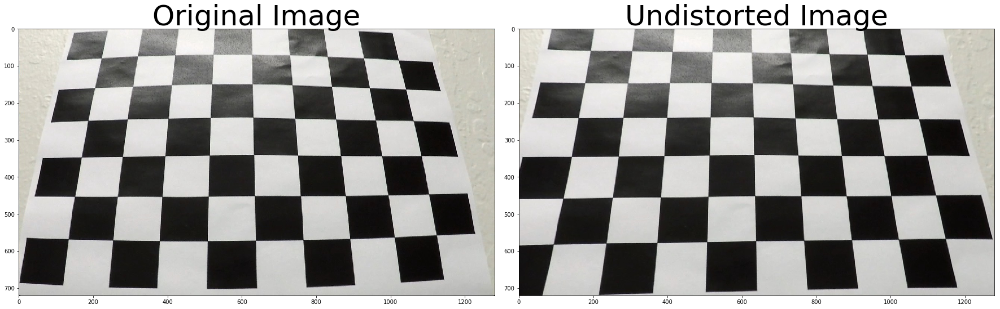

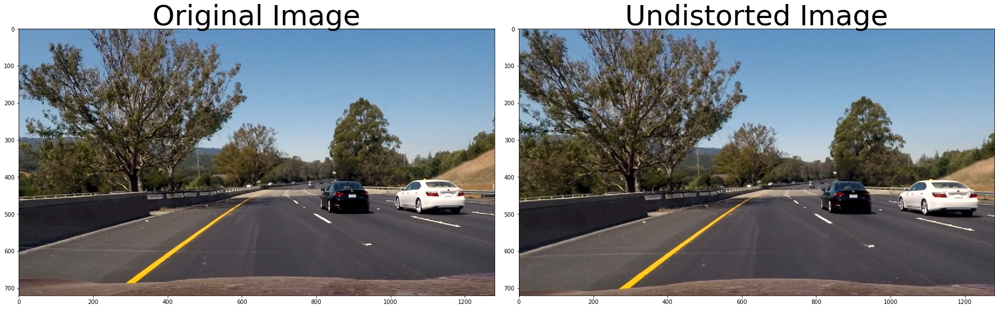

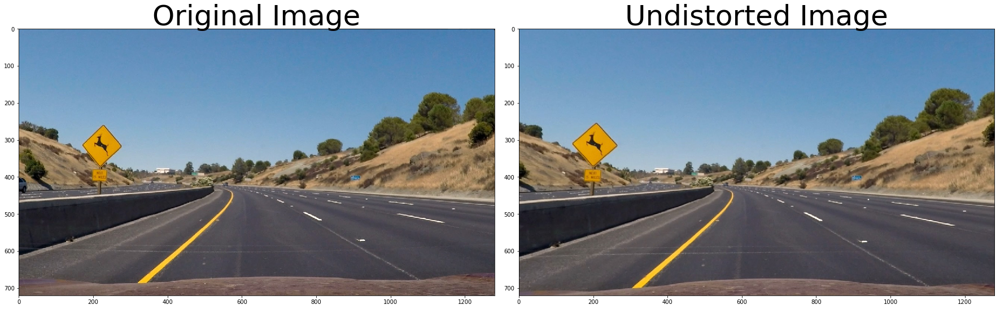

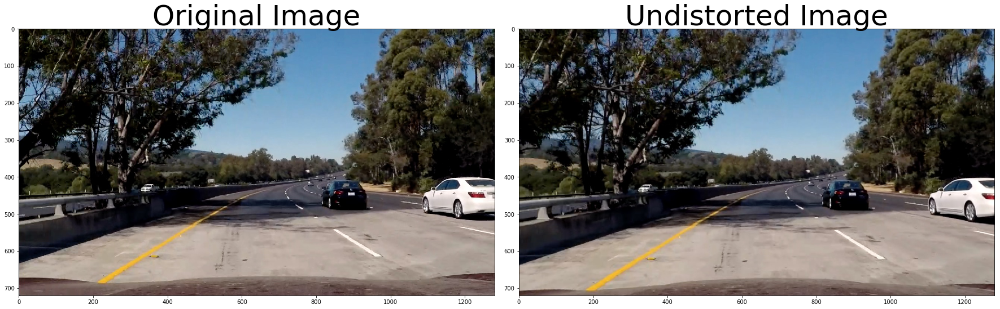

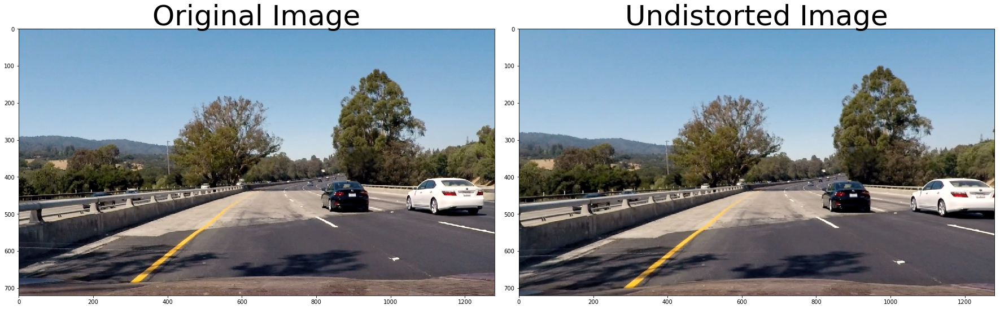

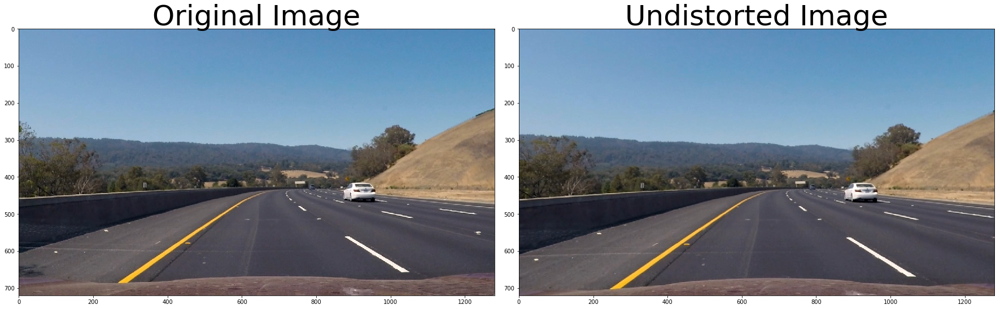

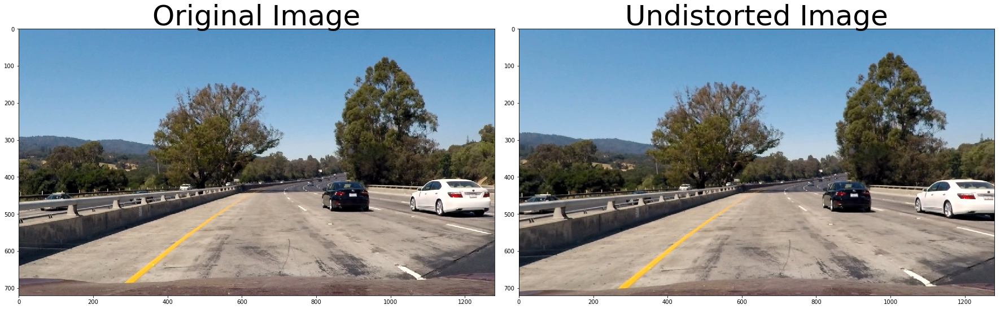

In [2]:
from skimage import io
sight=[images[0]]
sight.extend(glob.glob('./test_images/test*.jpg'))

print(sight)
for i in sight:  
    
    img=io.imread(i)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    plt.figure(figsize=(24, 9))

    f, (ax1, ax2) = plt.subplots(1,2,figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


    
cv2.destroyAllWindows()

[[  580.           460.        ]
 [  203.33332825   720.        ]
 [ 1101.66662598   720.        ]
 [  703.           460.        ]]
----------------------
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]
----------------------
----------------------
M [[ -5.12515169e-01  -1.50666316e+00   9.58804168e+02]
 [ -2.77555756e-15  -1.99215624e+00   9.16391870e+02]
 [ -3.25260652e-18  -2.38804132e-03   1.00000000e+00]]
----------------------
src.shape (4, 2) s.shape (5, 2)


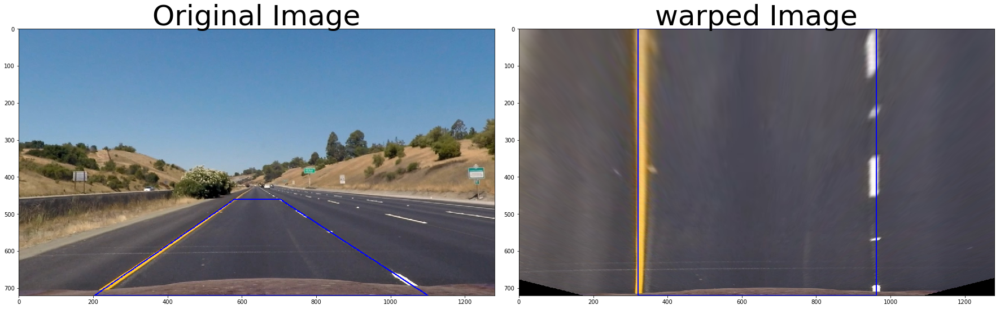

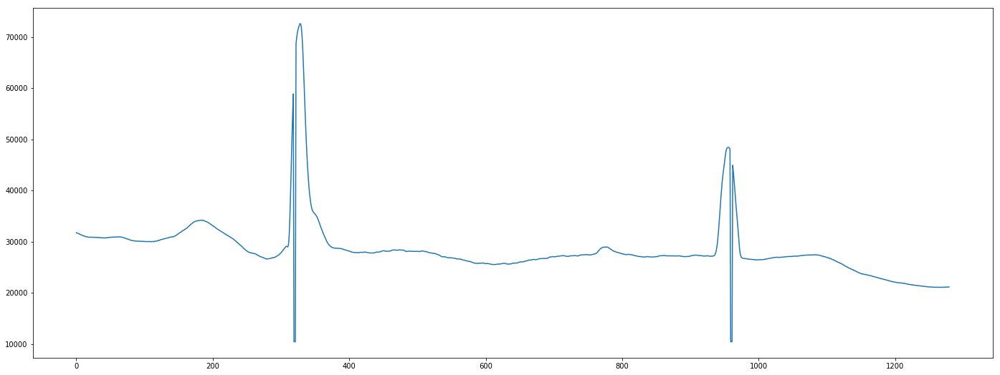

In [3]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

def unwarp(img,  mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
   
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)     
    
    img_size = (gray.shape[1], gray.shape[0])
    src = np.float32(
        [[(img_size[0] / 2) - 55 - 5, img_size[1] / 2 + 100], 
        [((img_size[0] / 6) - 10), img_size[1]], 
        [(img_size[0] * 5 / 6) + 35, img_size[1]], 
        [(img_size[0] / 2 + 55 + 8), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0], 
        [(img_size[0] / 4), img_size[1]], 
        [(img_size[0] * 3 / 4), img_size[1]], 
        [(img_size[0] * 3 / 4), 0]])
    
    
    print(src)
    print('----------------------')
    print(dst)
    print('----------------------')
    M = cv2.getPerspectiveTransform(src, dst)
    print('----------------------')
    print('M',M)
    print('----------------------')
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    disp=[undist,warped]
    
    s=src
    s=np.append(s,src[0])
    s=np.resize(s,(5,2))
    print('src.shape',src.shape,'s.shape',s.shape)
    d=dst
    d=np.append(d,dst[0])
    d=np.resize(d,(5,2))
    for k in range(4):
        cv2.line(disp[0],tuple(s[k]) ,tuple(s[k+1]), (0, 0, 255), 2)
        cv2.line(disp[1],tuple(d[k]) ,tuple(d[k+1]), (0, 0, 255), 2)
            
    plt.figure(figsize=(24, 9))
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(disp[0])
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(disp[1])
    ax2.set_title('warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return warped

from skimage import io    
import glob
sight=glob.glob('./test_images/straight_lines*.jpg')

img=io.imread(sight[0])
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

warped=unwarp(img,mtx,dist)


import numpy as np
gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
histogram = np.sum(gray[gray.shape[0]//2:,:], axis=0)
plt.figure(figsize=(24, 9))
plt.plot(histogram)   

[[  580.           460.        ]
 [  203.33332825   720.        ]
 [ 1101.66662598   720.        ]
 [  703.           460.        ]]
----------------------
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]
----------------------
----------------------
M [[ -5.12515169e-01  -1.50666316e+00   9.58804168e+02]
 [ -2.77555756e-15  -1.99215624e+00   9.16391870e+02]
 [ -3.25260652e-18  -2.38804132e-03   1.00000000e+00]]
----------------------
src.shape (4, 2) s.shape (5, 2)
binary_warped (720, 1280) 255
histogram.shape (1280,)
midpoint 640
leftx_base 392
rightx_base 1038
(array([  0,   0,   0, ..., 719, 719, 719]), array([ 220,  221,  222, ..., 1088, 1089, 1090]))
left_lane_inds (25970,)
right_lane_inds (11148,)
leftx (25970,) lefty (25970,)
rightx (11148,) righty (11148,)
x=0.000344*y2+-0.453417*y+525.622909
x=0.000203*y2+-0.292681*y+1131.325348


(720, 0)

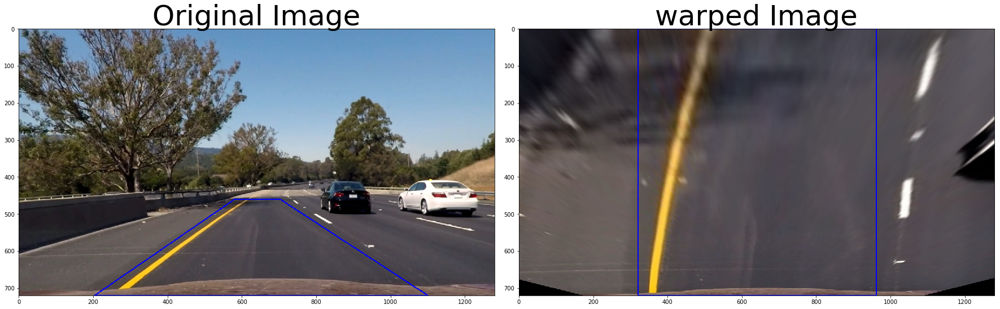

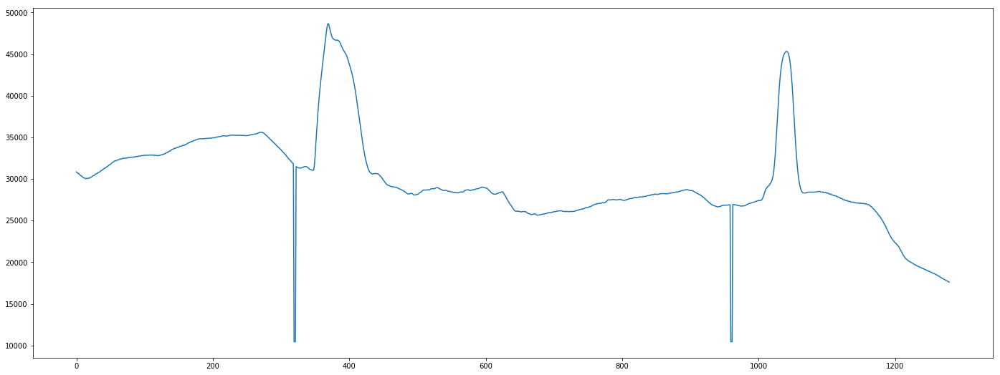

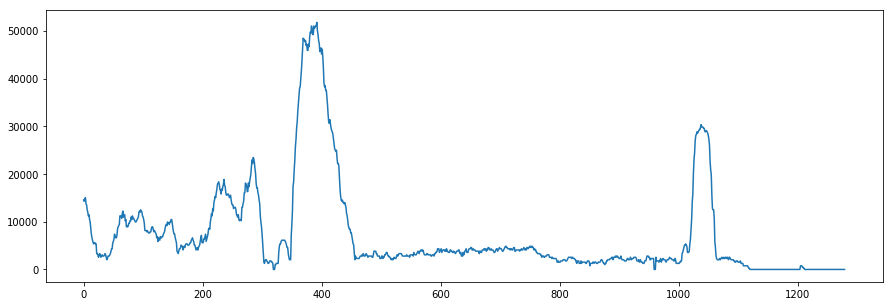

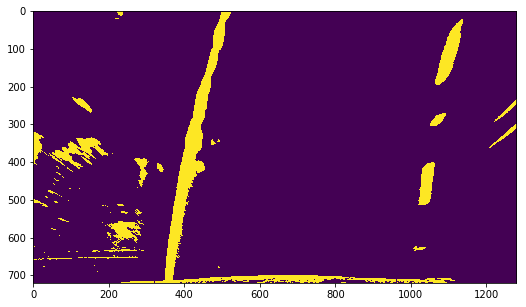

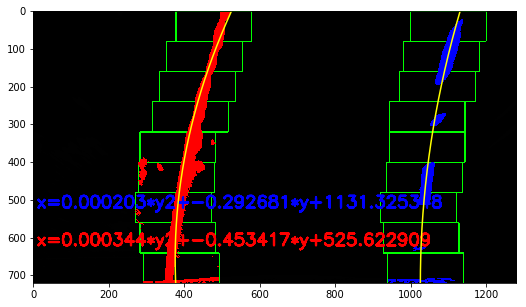

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from skimage import io    
import glob

sight=glob.glob('./test_images/test*.jpg')

img=io.imread(sight[0])
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
warped=unwarp(img,mtx,dist)
import numpy as np
gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
##########################################################
import numpy as np
gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
histogram = np.sum(gray[gray.shape[0]//2:,:], axis=0)
plt.figure(figsize=(24, 9))
plt.plot(histogram)   
thresh = 100
max_pixel = 255
ret, binary_warped = cv2.threshold(gray,
                             thresh,
                             max_pixel,
                             cv2.THRESH_BINARY)
print('binary_warped',binary_warped.shape,binary_warped.max())

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.figure(figsize=(15, 5))
plt.plot(histogram) 

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
print('histogram.shape',histogram.shape)
print('midpoint',midpoint)
print('leftx_base',leftx_base)
print('rightx_base',rightx_base)

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
#関数:nonzero()
#非ゼロ要素のあるインデックスを各軸ごとに１次元配列にして返します。
#配列(ndarray)のタプル(tuple)の形で返されます。
plt.figure(figsize=(15, 5))
plt.imshow(binary_warped)

print(nonzero)

nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

print('left_lane_inds',left_lane_inds.shape)
print('right_lane_inds',right_lane_inds.shape)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

print('leftx',leftx.shape,'lefty',lefty.shape)
print('rightx',rightx.shape,'righty',righty.shape)


# Fit a second order polynomial to each
# 2次式で近似する
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
#関数　linspace(x1,x2,n) はX1,X2間をn点の線分で連結
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


font = cv2.FONT_ITALIC
#文字の書き込み
text='x=%f*y2+%f*y+%f'%(left_fit[0],left_fit[1],left_fit[2],)
print(text)
cv2.putText(out_img,text,(10,out_img.shape[0]-100) ,font, 1.5 ,(255,0,0),5,cv2.LINE_AA )
text='x=%f*y2+%f*y+%f'%(right_fit[0],right_fit[1],right_fit[2],)
print(text)
cv2.putText(out_img,text,(10,out_img.shape[0]-200) ,font, 1.5 ,(0,0,255),5,cv2.LINE_AA )
    
    
    
plt.figure(figsize=(15, 5))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


(720, 1280, 3) 1 255
x=0.000834*y2+-0.047332*y+4.376521
curvature=0.001667,Radius=599.734056


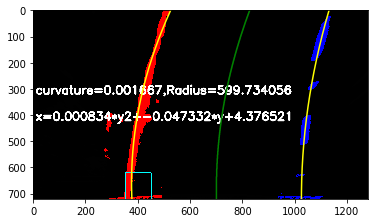

In [13]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
print(out_img.shape,out_img.max(),binary_warped.max())
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#########################################################
midy=ploty
midx=(left_fitx+right_fitx)//2
plt.plot(midx,midy , color='green')


# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension


midy=midy*ym_per_pix
midx=midx*xm_per_pix

mid_fit = np.polyfit(midy, midx, 2)
text='x=%f*y2+%f*y+%f'%(mid_fit[0],mid_fit[1],mid_fit[2],)
print(text)
cv2.putText(out_img,text,(10,out_img.shape[0]-300) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )
 

ypos= out_img.shape[0]
xpos= int(mid_fit[0]*ypos**2 + mid_fit[1]*ypos + mid_fit[2])
cv2.rectangle(out_img,(xpos-50,ypos-100),(xpos+50,ypos),(0,255,255), 2) 


f1=2*mid_fit[0]*(ypos*ym_per_pix)+mid_fit[1]
f2=2*mid_fit[0]
R=np.power((1.0+ np.power(f1,2)),1.5)/np.absolute(f2)
curvature=1.0/R

curvature_text='curvature=%f,Radius=%f'%(curvature,R)
print(curvature_text)
cv2.putText(out_img,curvature_text,(10,out_img.shape[0]-400) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )
 

plt.imshow(out_img)   

(720, 1280, 3) 1 255
dst
 [[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]
pts
 [[[ 320.    0.]]

 [[ 320.  720.]]

 [[ 960.  720.]]

 [[ 960.    0.]]]
check
 [[[  580.           460.        ]]

 [[  203.33329773   720.        ]]

 [[ 1101.66638184   720.        ]]

 [[  703.           460.        ]]]
src
 [[  580.           460.        ]
 [  203.33332825   720.        ]
 [ 1101.66662598   720.        ]
 [  703.           460.        ]]
pos
 [[ 525.62290897    0.        ]
 [ 525.16983638    1.        ]
 [ 524.71745272    2.        ]
 ..., 
 [ 377.60881243  717.        ]
 [ 377.64970339  718.        ]
 [ 377.69128328  719.        ]]
conv
 [[[ 619.51815282  460.        ]]

 [[ 619.406686    460.04950277]]

 [[ 619.29508402  460.0991245 ]]

 ..., 
 [[ 293.29529161  712.29034391]]

 [[ 290.37068087  714.8160055 ]]

 [[ 287.39626391  717.38550704]]]
pos (720, 2) float64 conv (720, 2) int32
pos
 [[  1.13132535e+03   0.00000000e+00]
 [  1.13103287e+03   1.00000000e+00]
 [  1.13074

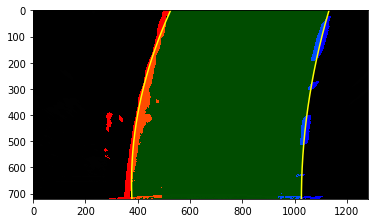

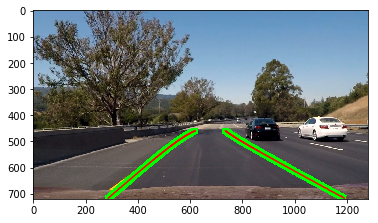

In [14]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
print(out_img.shape,out_img.max(),binary_warped.max())
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
lane_line_window1 = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
lane_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])

lane_line_pts = np.hstack((lane_line_window1, lane_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([lane_line_pts]), (0,255, 0))
#画像の合成
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure()
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#################################################################
sight=glob.glob('./test_images/test*.jpg')
img=io.imread(sight[0])
plt.figure()
plt.imshow(img)
src = np.float32(
    [[(img_size[0] / 2) - 55 - 5, img_size[1] / 2 + 100], 
    [((img_size[0] / 6) - 10), img_size[1]], 
    [(img_size[0] * 5 / 6) + 35, img_size[1]], 
    [(img_size[0] / 2 + 55 + 8), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0], 
    [(img_size[0] / 4), img_size[1]], 
    [(img_size[0] * 3 / 4), img_size[1]], 
    [(img_size[0] * 3 / 4), 0]])

iM = cv2.getPerspectiveTransform(dst, src)
# Warp the image using OpenCV warpPerspective()
#test=[left_fitx,ploty]
#iWarped = cv2.warpPerspective(test, iM, img_size)

print('dst\n',dst)
pts = np.float32(dst).reshape(-1,1,2)
print('pts\n',pts)
check = cv2.perspectiveTransform(pts,iM)
print('check\n',check)
print('src\n',src)


##########結合
for k in range(2):
    if k==0:
        pos=np.c_[left_fitx,ploty]
    else:
        pos=np.c_[right_fitx,ploty]


    print('pos\n',pos)
    conv = cv2.perspectiveTransform(pos.reshape(-1,1,2),iM)
    print('conv\n',conv)
    #
    #img[conv[0],conv[1]] = [0, 0, 255]

    conv.resize(pos.shape)
    conv=conv.astype(np.int32)
    print('pos',pos.shape,pos.dtype,'conv',conv.shape,conv.dtype)
    for xy in conv:
        cv2.rectangle(img,(xy[0]-10,xy[1]-10),(xy[0]+10,xy[1]+10),  (0,255,0), 2) 
        img[xy[1],xy[0]-3] = [255, 0, 255]
        img[xy[1],xy[0]-2] = [255, 0, 255]
        img[xy[1],xy[0]] = [255, 0, 255]
        img[xy[1],xy[0]+3] = [255, 0, 255]
        img[xy[1],xy[0]+2] = [255, 0, 255]

    plt.plot(conv[:,0],conv[:,1], color='red')

plt.imshow(img)



posL (720, 2) posR (720, 2)
convL (720, 2) convR (720, 2)
lane_img (720, 1280, 3)
lane_plots (1440, 2)
(4, 2)


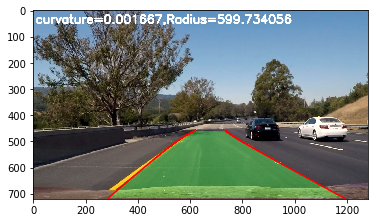

In [15]:

from skimage import io    
import glob

sight=glob.glob('./test_images/test*.jpg')
img=io.imread(sight[0])

##########結合
posL=np.c_[left_fitx,ploty]
posR=np.c_[right_fitx,ploty]


print('posL',posL.shape,'posR',posR.shape,)
convL = cv2.perspectiveTransform(posL.reshape(-1,1,2),iM)

convR = cv2.perspectiveTransform(posR.reshape(-1,1,2),iM)


convL.resize(posL.shape)
convL=convL.astype(np.int)
convR.resize(posR.shape)
convR=convR.astype(np.int)
print('convL',convL.shape,'convR',convR.shape,)

lane_img=img*0
print('lane_img',lane_img.shape)

#lane_window1 = np.array([np.transpose(np.vstack(convL))])
#lane_window2 = np.array([np.flipud(np.transpose(np.vstack(convR)))])
#lane_plots = np.hstack((lane_window1, lane_window2))
lane_plots = np.r_[convL,np.flipud(convR)]
#lane_plots=np.transpose(lane_plots)
print('lane_plots',lane_plots.shape)

contours = np.array( [ [0,0], [0,10], [10, 10], [10,0] ] )
print(contours.shape)
cv2.fillPoly(lane_img,[lane_plots], (0,255, 0))
#画像の合成

result = cv2.addWeighted(img, 1, lane_img, 0.3, 0)
plt.figure()
plt.plot(convL[:,0],convL[:,1], color='red')
plt.plot(convR[:,0],convR[:,1], color='red')
cv2.putText(result,curvature_text,(10,50) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )
 
plt.imshow(result)
plt.show()

In [16]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import cv2
import matplotlib.pyplot as plt


def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    # TODO: Build your pipeline that will draw lane lines on the test_images
    # then save them to the test_images directory.

    # TODO: Build your pipeline that will draw lane lines on the test_images
    # then save them to the test_images directory.

    import datetime
    now = datetime.datetime.now()
    font = cv2.FONT_ITALIC
    result =cv2.putText(image,str(now),(10,50) ,font, 1.5 ,(255,255,255),5,cv2.LINE_AA )
 

    return result



In [9]:
prj_output = 'videos_output/project_ans.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1  = VideoFileClip("./project_video.mp4").subclip(0,5)
#white_clip  =  clip1.fl_image(test_image) #NOTE: this function expects color images!!
white_clip  =  clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(prj_output, audio=False)



[MoviePy] >>>> Building video videos_output/project_ans.mp4
[MoviePy] Writing video videos_output/project_ans.mp4


 99%|█████████▉| 125/126 [00:10<00:00, 10.20it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/project_ans.mp4 

CPU times: user 1e+03 ms, sys: 324 ms, total: 1.32 s
Wall time: 14.2 s


In [10]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(prj_output))

